### Implementation of GradCAM and plot results obtained

In [8]:
import os
import torch
import pandas as pd
import cv2
import numpy as np
import matplotlib.pyplot as plt
import re
import segmentation_models_pytorch as smp
import albumentations as A
from torch.utils.data import Dataset, DataLoader
import seaborn as sns
import torch.nn.functional as F

# Custom metrics and loss
#from metrics import *

#import wandb  # Optional for logging
from PIL import Image  # For visualization

#ATTENTION: this ipynb must be inside the Project folder
EFFICENTNET_PATH = "/home/stud/fmarchetto/SegmentationTests/Project/best_unetEfficentNet2_model.pth"
RESNET_PATH = "/home/stud/fmarchetto/SegmentationTests/Project/best_unetResnet_model.pth"

device  = "cuda" if torch.cuda.is_available() else "cpu"
device

'cuda'

### load custum trained models

In [30]:
resnet_model = smp.Unet(
    encoder_name="resnet34",
    encoder_weights="imagenet",
    in_channels=3,
    classes=1,
    activation=None,  
)
resnet_model.load_state_dict(torch.load(RESNET_PATH, map_location=device))
resnet_model.to(device) 
resnet_model.eval()  
print("ResNet model loaded successfully")

## LOAD THE EFFICIENTNET MODEL
efficentnet_model = smp.Unet(
    encoder_name="efficientnet-b2",
    encoder_weights="imagenet",
    in_channels=3,
    classes=1,
    activation=None,  
)
efficentnet_model.load_state_dict(torch.load(EFFICENTNET_PATH, map_location=device))  
efficentnet_model.to(device)  
efficentnet_model.eval() 
print("EfficientNet model loaded successfully")


ResNet model loaded successfully
EfficientNet model loaded successfully


In [27]:
print(next(resnet_model.parameters()).shape)
print(next(efficentnet_model.parameters()).shape)

torch.Size([64, 3, 7, 7])
torch.Size([32, 3, 3, 3])


### load dataset containing images and plot some informations

In [14]:
## load csv files with paths
test_df = pd.read_csv('../Data/test_df.csv')
train_df = pd.read_csv('../Data/balanced_train_df.csv')
val_df = pd.read_csv('../Data/val_df.csv')


plot_path = "plots/"
if not os.path.exists(plot_path):
    os.makedirs(plot_path)
    print(f"Directory {plot_path} created.")
else:
    print(f"Directory {plot_path} already exists.")

#test_df.head()
val_df.head()

Directory plots/ created.


,patient,image_path,mask_path,slice_num,diagnosis,patient_clean,RNASeqCluster,MethylationCluster,miRNACluster,CNCluster,...,histological_type,neoplasm_histologic_grade,tumor_tissue_site,laterality,tumor_location,gender,age_at_initial_pathologic,race,ethnicity,death01
0,TCGA_CS_4942_19970222,/home/stud/fmarchetto/SegmentationTests/Data/k...,/home/stud/fmarchetto/SegmentationTests/Data/k...,1,0,TCGA_CS_4942,1.0,5.0,2.0,1.0,...,1.0,2.0,1.0,3.0,2.0,1.0,44.0,2.0,2.0,1.0
1,TCGA_CS_4942_19970222,/home/stud/fmarchetto/SegmentationTests/Data/k...,/home/stud/fmarchetto/SegmentationTests/Data/k...,10,1,TCGA_CS_4942,1.0,5.0,2.0,1.0,...,1.0,2.0,1.0,3.0,2.0,1.0,44.0,2.0,2.0,1.0
2,TCGA_CS_4942_19970222,/home/stud/fmarchetto/SegmentationTests/Data/k...,/home/stud/fmarchetto/SegmentationTests/Data/k...,11,1,TCGA_CS_4942,1.0,5.0,2.0,1.0,...,1.0,2.0,1.0,3.0,2.0,1.0,44.0,2.0,2.0,1.0
3,TCGA_CS_4942_19970222,/home/stud/fmarchetto/SegmentationTests/Data/k...,/home/stud/fmarchetto/SegmentationTests/Data/k...,12,1,TCGA_CS_4942,1.0,5.0,2.0,1.0,...,1.0,2.0,1.0,3.0,2.0,1.0,44.0,2.0,2.0,1.0
4,TCGA_CS_4942_19970222,/home/stud/fmarchetto/SegmentationTests/Data/k...,/home/stud/fmarchetto/SegmentationTests/Data/k...,13,1,TCGA_CS_4942,1.0,5.0,2.0,1.0,...,1.0,2.0,1.0,3.0,2.0,1.0,44.0,2.0,2.0,1.0


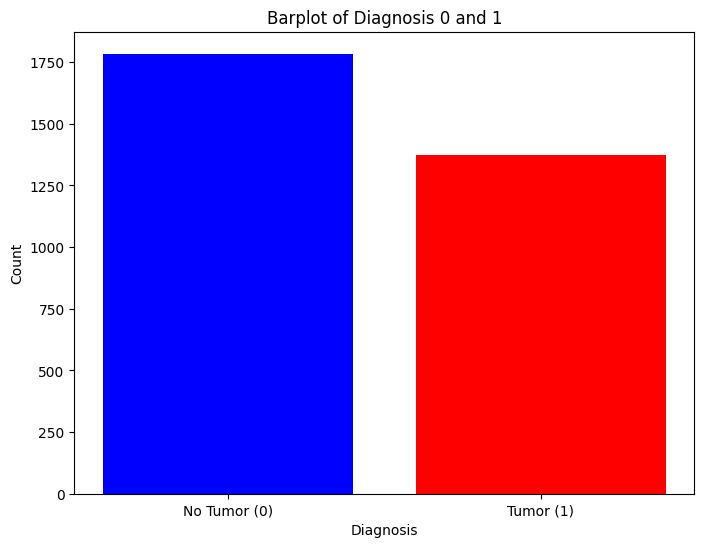

In [15]:
## printing some plot about the datasets
df = pd.concat([train_df,val_df, test_df], ignore_index=True)
diagnosis_counts = df['diagnosis'].value_counts().sort_index()
# Create the barplot
plt.figure(figsize=(8, 6))
plt.bar(diagnosis_counts.index, diagnosis_counts.values, color=['blue', 'red'])
plt.xlabel('Diagnosis')
plt.ylabel('Count')
plt.title('Barplot of Diagnosis 0 and 1')
plt.xticks([0, 1], ['No Tumor (0)', 'Tumor (1)'])

plt.savefig(os.path.join(plot_path, 'Diagnosis_barplot.png'), dpi=300, bbox_inches='tight')
plt.show()


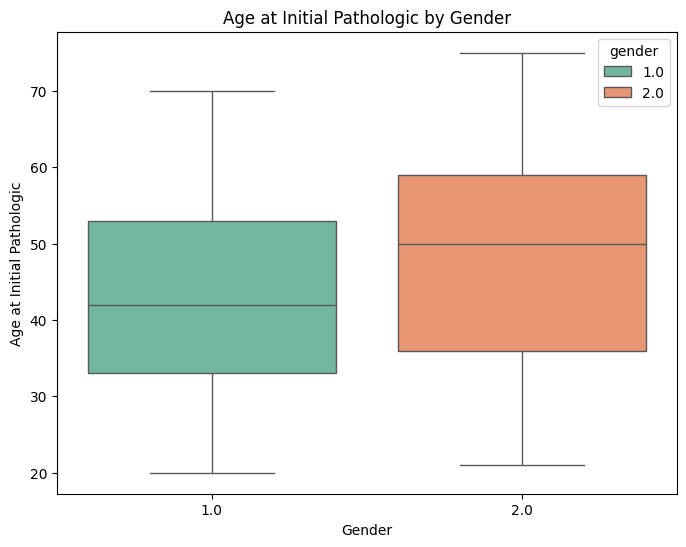

In [16]:
# box plot gender/ ages
plt.figure(figsize=(8, 6))
sns.boxplot(x='gender', y='age_at_initial_pathologic', data=df, hue='gender', palette='Set2')
plt.title('Age at Initial Pathologic by Gender')
plt.xlabel('Gender')
plt.ylabel('Age at Initial Pathologic')

plt.savefig(os.path.join(plot_path, 'Age_at_Initial_Pathologic_by_Gender_boxplot.png'), dpi=300, bbox_inches='tight')
plt.show()

In [ ]:
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

# 1. Race distribution
df['race'].value_counts().plot(kind='bar', ax=axes[0, 0], color='skyblue', edgecolor='black')
axes[0, 0].set_title('Distribution by Race', fontsize=12, fontweight='bold')
axes[0, 0].set_xlabel('Race')
axes[0, 0].set_ylabel('Count')
axes[0, 0].tick_params(axis='x', rotation=45)

# 2. Ethnicity distribution
df['ethnicity'].value_counts().plot(kind='bar', ax=axes[0, 1], color='lightcoral', edgecolor='black')
axes[0, 1].set_title('Distribution by Ethnicity', fontsize=12, fontweight='bold')
axes[0, 1].set_xlabel('Ethnicity')
axes[0, 1].set_ylabel('Count')
axes[0, 1].tick_params(axis='x', rotation=45)

# 3. Gender distribution
df['gender'].value_counts().plot(kind='bar', ax=axes[1, 0], color='lightgreen', edgecolor='black')
axes[1, 0].set_title('Distribution by Gender', fontsize=12, fontweight='bold')
axes[1, 0].set_xlabel('Gender')
axes[1, 0].set_ylabel('Count')
axes[1, 0].tick_params(axis='x', rotation=0)

# 4. Age at initial pathologic (histogram)
axes[1, 1].hist(df['age_at_initial_pathologic'].dropna(), bins=20, color='orange', edgecolor='black')
axes[1, 1].set_title('Distribution by Age at Initial Pathologic', fontsize=12, fontweight='bold')
axes[1, 1].set_xlabel('Age')
axes[1, 1].set_ylabel('Count')

plt.tight_layout()
plt.savefig(os.path.join(plot_path, 'Dataset_Demographic_Distribution.png'), dpi=300, bbox_inches='tight')
plt.show()

## testing models

loading images and masks

In [19]:
old_prefix = "/home/stud/fmarchetto/SegmentationTests/Data/"  # prefix inside the csv
new_prefix = "../Data/"  # new prefix

# load images and masks into lists
def load_images_and_masks(df):
    images = []
    masks = []
    for _, row in test_df.iterrows():
        img_path = row['image_path'].replace(old_prefix, new_prefix)
        mask_path = row['mask_path'].replace(old_prefix, new_prefix)
        #print(f"Loading image: {img_path}, mask: {mask_path}")

        img = cv2.imread(img_path)  # load RGB image
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)  # load mask in grayscale
        if img is not None and mask is not None:
            images.append(img)
            masks.append(mask)
        else:
            print(f"Error loading: {row['image_path']} or {row['mask_path']}")

    return images, masks



In [20]:
## VISUALIZE SAMPLES WITH MASKS OVERLAID
def visualize_samples(images, masks, n_samples=4):
    tumor_indices = [i for i in range(len(masks)) if np.any(masks[i] > 0)]
    non_tumor_indices = [i for i in range(len(masks)) if not np.any(masks[i] > 0)]

    tumor_samples = np.random.choice(tumor_indices, min(n_samples, len(tumor_indices)), replace=False)
    non_tumor_samples = np.random.choice(non_tumor_indices, min(n_samples, len(non_tumor_indices)), replace=False)

    fig, axs = plt.subplots(2, n_samples, figsize=(12, 8))
    for col, idx in enumerate(tumor_samples):
        axs[0, col].imshow(images[idx])
        axs[0, col].imshow(masks[idx].squeeze(), cmap="Reds", alpha=0.4)
        axs[0, col].title.set_text("Tumor")
        axs[0, col].axis("off")

    for col, idx in enumerate(non_tumor_samples):
        axs[1, col].imshow(images[idx])
        axs[1, col].imshow(masks[idx].squeeze(), cmap="Reds", alpha=0.3)
        axs[1, col].title.set_text("No Tumor")
        axs[1, col].axis("off")

    plt.tight_layout()
    plt.savefig(os.path.join(plot_path, f'Sample_Images_with_Masks_{n_samples}.png'), dpi=300, bbox_inches='tight')
    plt.show()



### Normalization of the images

In [21]:
class MRI_Dataset(Dataset):
    def __init__(self, images, masks, transform=None):
        self.images = images
        self.masks = masks
        self.transform = transform

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img = self.images[idx]
        mask = self.masks[idx]

        # Resize to fixed size (es. 256x256)
        img = cv2.resize(img, (256, 256), interpolation=cv2.INTER_LINEAR)
        mask = cv2.resize(mask, (256, 256), interpolation=cv2.INTER_NEAREST)  # Per maschera binaria

        # 3. Normalize image and mask values into [0,1]
        img = img.astype(np.float32) / 255.0
        mask = (mask > 0).astype(np.float32)  # everything >0 becomes 1, everything 0 remains 0

        if self.transform:
            augmented = self.transform(image=img, mask=mask)
            img = augmented['image']  # tensor [C, H, W]
            mask = augmented['mask']  # tensor [H, W] or [C, H, W] for grayscale
        else:
            if img.ndim == 2:  # If grayscale, add channel dimension
                img = np.expand_dims(img, axis=-1)
            img = torch.tensor(img.transpose(2, 0, 1), dtype=torch.float32)  # [C,H,W]
            mask = torch.tensor(mask).unsqueeze(0).float()  # [1,H,W]
        print(f"Mask shape after processing: {mask.shape}")  # Debug

        return img, mask


In [22]:
test_images, test_masks = load_images_and_masks(test_df)
train_images, train_masks = load_images_and_masks(train_df)
val_images, val_masks = load_images_and_masks(val_df)

test_dataset = MRI_Dataset(test_images, test_masks )  # No transform for test
test_loader = DataLoader(test_dataset, batch_size=4, shuffle=False)
print(test_dataset.__getitem__(0))

val_dataset = MRI_Dataset(val_images, val_masks)  # No transform for validation
val_loader = DataLoader(val_dataset, batch_size=4, shuffle=False)

train_dataset = MRI_Dataset(train_images, train_masks)  # No transform for training
train_loader = DataLoader(train_dataset, batch_size=4, shuffle=True)

Mask shape after processing: torch.Size([1, 256, 256])
(tensor([[[0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         ...,
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.]],

        [[0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         ...,
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.]],

        [[0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         ...,
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.]]]), tensor([[[0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         ...,
         [0., 0., 0.

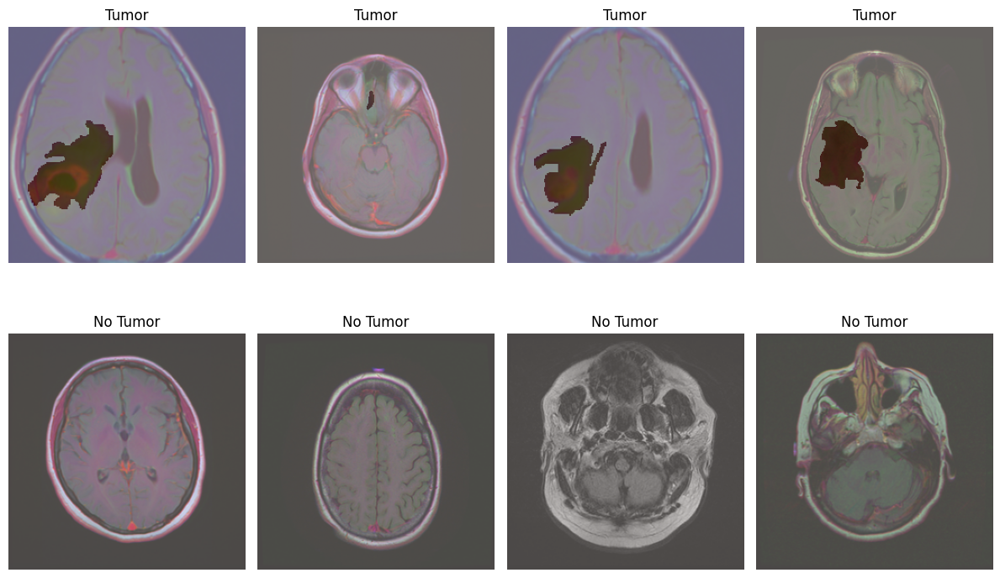

In [23]:
visualize_samples(train_images, train_masks, n_samples=4)

## Model Prediction
Compare the predicted mask with the ground truth

In [ ]:
def model_prediction(dataset, model, n_samples=5):
    """Generate and save predictions for n_samples from the dataset"""
    
    # Create directories
    prediction_path = "prediction_images/"
    model_path = os.path.join(prediction_path, model.name.lower().replace('-', '_'))
    os.makedirs(model_path, exist_ok=True)
    print(f"Saving predictions to: {model_path}")

    images = []
    masks = []
    predictions = []
    
    model.eval()  # Ensure model is in eval mode
    
    for i in range(n_samples):
        idx = np.random.randint(0, len(dataset))
        img, mask = dataset[idx]
        
        images.append(img)
        masks.append(mask)
        
        # Make prediction
        with torch.no_grad():
            # ← FIXED: Move input to same device as model
            input_tensor = img.unsqueeze(0).to(device)
            
            # ← FIXED: Get raw logits
            logits = model(input_tensor)
            
            # ← FIXED: Apply sigmoid ONCE (since model has activation=None)
            pred_mask = torch.sigmoid(logits).squeeze().cpu().numpy()
            
            predictions.append(pred_mask)
            
            # Visualize
            fig, axes = plt.subplots(1, 3, figsize=(15, 5))
            
            # Original image
            axes[0].imshow(img.permute(1, 2, 0).cpu().numpy())
            axes[0].set_title(f'Original Image (Sample {idx})')
            axes[0].axis('off')
            
            # Predicted mask
            axes[1].imshow(pred_mask, cmap='gray', vmin=0, vmax=1)
            axes[1].set_title(f'Predicted Mask ({model.name})')
            axes[1].axis('off')
            
            # True mask
            axes[2].imshow(mask.squeeze().cpu().numpy(), cmap='gray', vmin=0, vmax=1)
            axes[2].set_title('Ground Truth Mask')
            axes[2].axis('off')
            
            plt.tight_layout()
            
            # Save figure
            save_path = os.path.join(
                model_path, 
                f'prediction_{model.name.lower().replace("-", "_")}_sample_{idx}.png'
            )
            plt.savefig(save_path, dpi=300, bbox_inches='tight')
            print(f"Saved: {save_path}")
            
            plt.show()
            plt.close()

    return images, masks, predictions




=== Testing ResNet Model ===
Saving predictions to: prediction_images/u_resnet34
Mask shape after processing: torch.Size([1, 256, 256])
Saved: prediction_images/u_resnet34/prediction_u_resnet34_sample_334.png


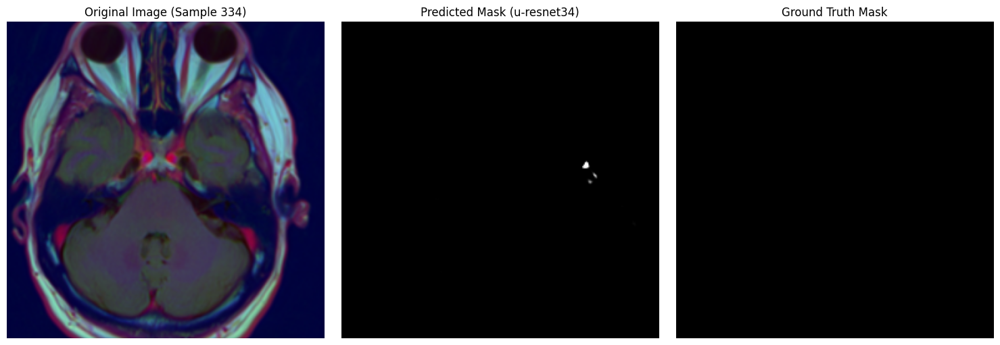

Mask shape after processing: torch.Size([1, 256, 256])
Saved: prediction_images/u_resnet34/prediction_u_resnet34_sample_25.png


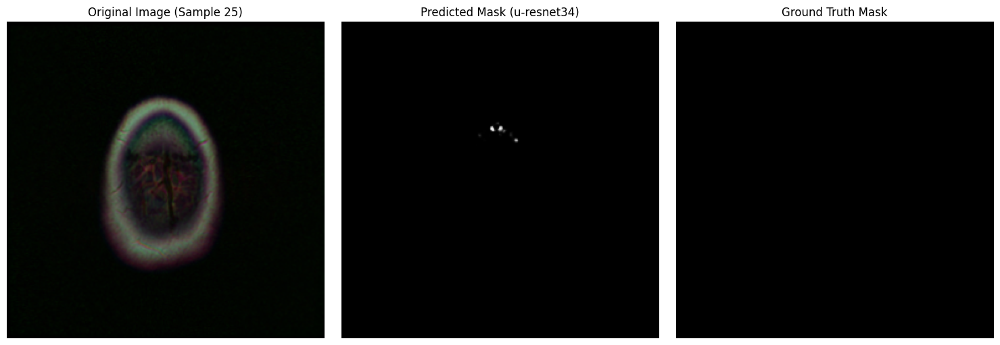

Mask shape after processing: torch.Size([1, 256, 256])
Saved: prediction_images/u_resnet34/prediction_u_resnet34_sample_416.png


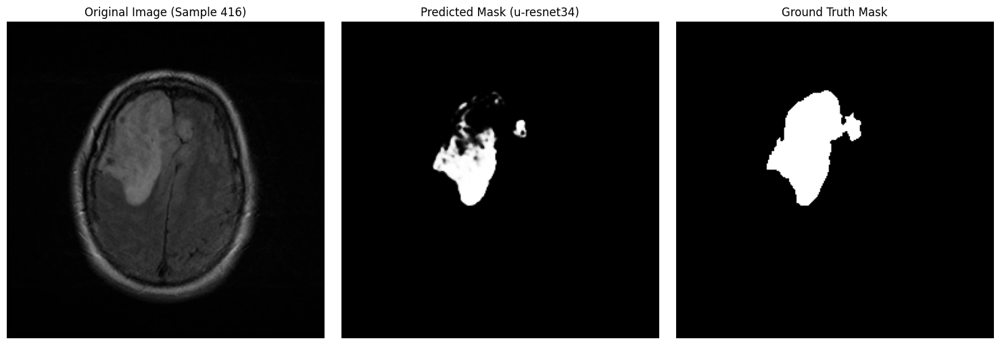

Mask shape after processing: torch.Size([1, 256, 256])
Saved: prediction_images/u_resnet34/prediction_u_resnet34_sample_380.png


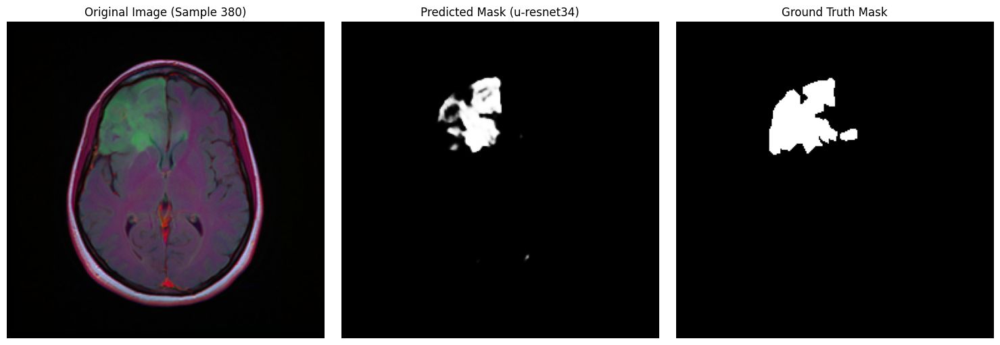

Mask shape after processing: torch.Size([1, 256, 256])
Saved: prediction_images/u_resnet34/prediction_u_resnet34_sample_401.png


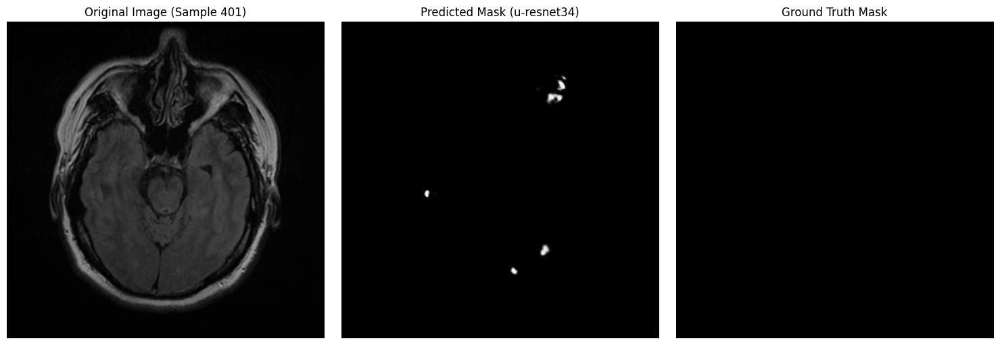


=== Testing EfficientNet Model ===
Saving predictions to: prediction_images/u_efficientnet_b2
Mask shape after processing: torch.Size([1, 256, 256])
Saved: prediction_images/u_efficientnet_b2/prediction_u_efficientnet_b2_sample_49.png


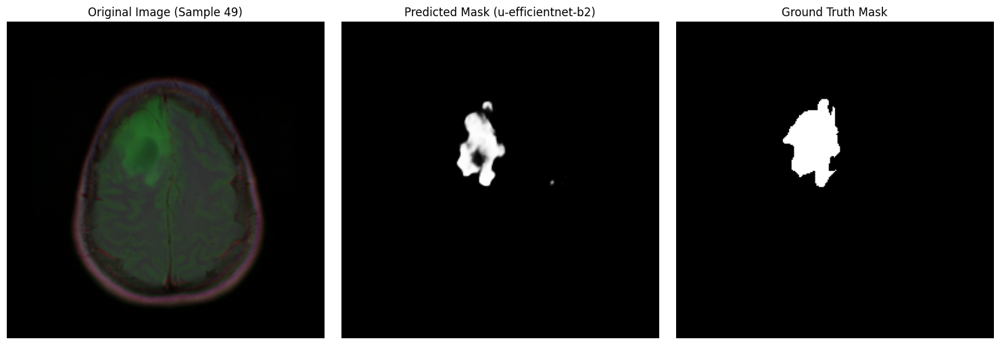

Mask shape after processing: torch.Size([1, 256, 256])
Saved: prediction_images/u_efficientnet_b2/prediction_u_efficientnet_b2_sample_54.png


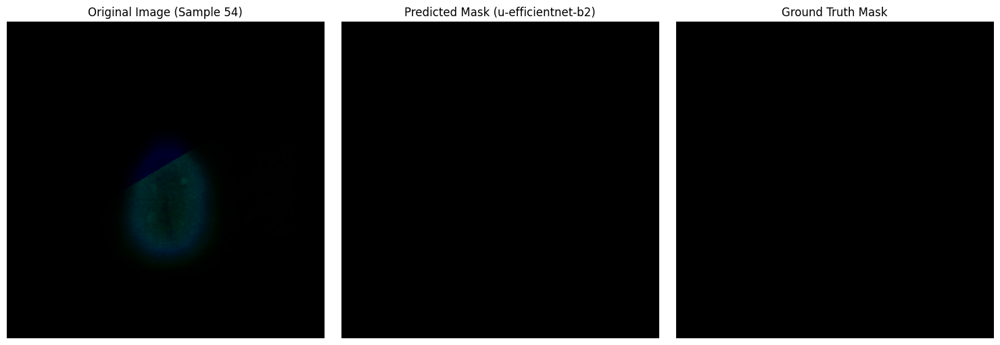

Mask shape after processing: torch.Size([1, 256, 256])
Saved: prediction_images/u_efficientnet_b2/prediction_u_efficientnet_b2_sample_291.png


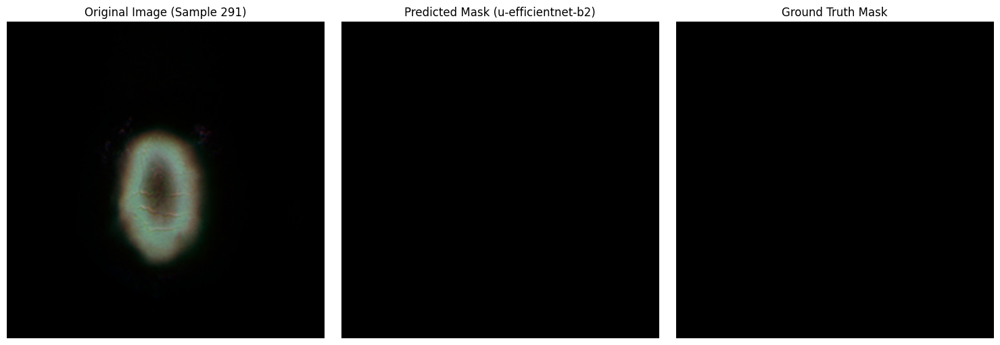

Mask shape after processing: torch.Size([1, 256, 256])
Saved: prediction_images/u_efficientnet_b2/prediction_u_efficientnet_b2_sample_312.png


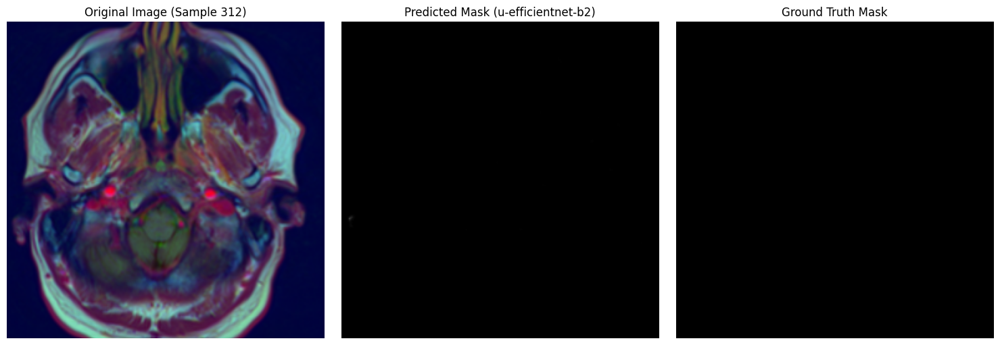

Mask shape after processing: torch.Size([1, 256, 256])
Saved: prediction_images/u_efficientnet_b2/prediction_u_efficientnet_b2_sample_284.png


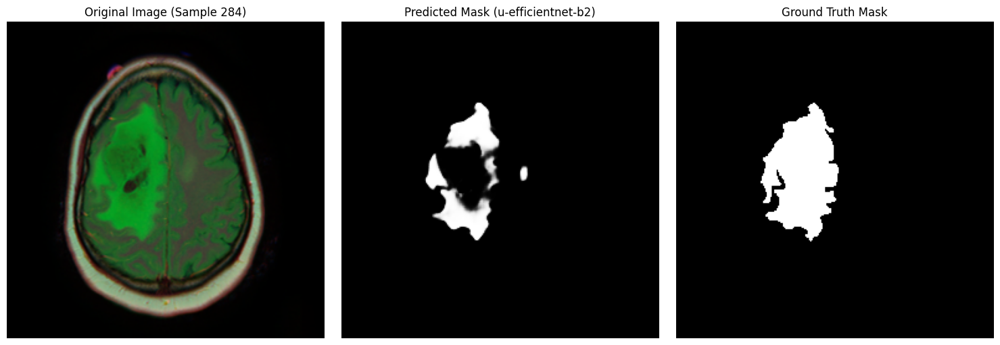

In [52]:
print("\n=== Testing ResNet Model ===")
resnet_images, resnet_masks, resnet_preds = model_prediction(
    test_dataset, resnet_model, n_samples=5
)

print("\n=== Testing EfficientNet Model ===")
efficientnet_images, efficientnet_masks, efficientnet_preds = model_prediction(
    test_dataset, efficentnet_model, n_samples=5
)

### USE GRADCAM


In [49]:
class GradCAM:
    def __init__(self, model, target_layer, device='cuda'):
        self.model = model
        self.target_layer = target_layer
        self.device = device
        self.gradients = None
        self.activations = None
        self.hook_handles = []
        self._register_hooks()

    def _register_hooks(self):
        def forward_hook(module, input, output):
            self.activations = output.detach()
        
        def backward_hook(module, grad_in, grad_out):
            self.gradients = grad_out[0].detach()
        
        self.hook_handles.append(
            self.target_layer.register_forward_hook(forward_hook)
        )
        self.hook_handles.append(
            self.target_layer.register_full_backward_hook(backward_hook)
        )

    def generate(self, input_tensor, use_positive_only=True, threshold=0.5):
        """
        Generate GradCAM heatmap
        
        Args:
            input_tensor: Input image [1, C, H, W]
            use_positive_only: Only backprop from positive predictions (better for segmentation)
            threshold: Threshold for positive predictions
        """
        input_tensor = input_tensor.to(self.device)
        input_tensor.requires_grad = True
        
        self.model.zero_grad()
        output = self.model(input_tensor)  # [1, 1, H, W]
        
        # ← FIXED: Better target for segmentation
        if use_positive_only:
            # Only backprop from regions predicted as positive (tumor)
            positive_mask = (output > threshold).float()
            target = (output * positive_mask).sum()
            
            # Fallback if no positive predictions
            if target == 0:
                target = output.sum()
        else:
            # Use sum of all predictions (your old code used this)
            target = output.sum()
        
        target.backward()

        if self.gradients is None:
            raise RuntimeError("Gradients not captured. Check target layer.")
        
        # Compute weights (global average pooling of gradients)
        weights = self.gradients.mean(dim=(2, 3), keepdim=True)
        
        # Weighted combination of forward activation maps
        cam = (weights * self.activations).sum(dim=1, keepdim=True)
        
        # Apply ReLU to keep only positive influences
        cam = F.relu(cam)
        
        # Resize to input size
        cam = F.interpolate(
            cam, 
            size=input_tensor.shape[2:], 
            mode='bilinear', 
            align_corners=False
        )
        
        # Normalize to [0, 1]
        cam = cam.squeeze().cpu().numpy()
        cam_min = cam.min()
        cam_max = cam.max()
        
        if cam_max - cam_min > 1e-8:
            cam = (cam - cam_min) / (cam_max - cam_min)
        else:
            cam = np.zeros_like(cam)
        
        return cam

    def remove_hooks(self):
        for handle in self.hook_handles:
            handle.remove()


In [39]:
efficentnet_model.name.lower()

'u-efficientnet-b2'

In [64]:

def check_model_has_activation(model):
    """Check if model has built-in Activation module"""
    for module in model.segmentation_head:
        if module.__class__.__name__ == 'Activation':
            return True
    return False


def gradcam_visualization(test_dataset, model, device='cuda', n_samples=5, 
                          use_positive_only=True, threshold=0.5):
    """
    Generate GradCAM visualizations for test samples
    
    Args:
        test_dataset: Dataset with test images
        model: Segmentation model
        device: 'cuda' or 'cpu'
        n_samples: Number of samples to visualize
        use_positive_only: Only backprop from positive predictions (recommended for segmentation)
        threshold: Threshold for considering predictions as positive
    """
    
    # Create directories
    gradcam_path = "gradcam_images/"
    model_name_clean = model.name.lower().replace('-', '_').replace(' ', '_')
    model_path = os.path.join(gradcam_path, model_name_clean)
    os.makedirs(model_path, exist_ok=True)
    print(f"Saving GradCAMs to: {model_path}")
    
    # Ensure model is on device and in eval mode
    model.to(device)
    model.eval()
    
    # Check if model has built-in activation
    has_activation = check_model_has_activation(model)
    print(f"Model has built-in activation: {has_activation}")
    print(f"Using positive-only gradients: {use_positive_only}")

    # Select target layer based on encoder type
    encoder_name = model.encoder.__class__.__name__.lower()
    
    if 'resnet' in encoder_name:
        target_layer = model.encoder.layer4[-1]
        print(f"Using ResNet target layer: {target_layer.__class__.__name__}")
    elif 'efficientnet' in encoder_name:
        target_layer = model.encoder._blocks[-1]
        print(f"Using EfficientNet target layer: {target_layer.__class__.__name__}")
    else:
        raise ValueError(f"Unsupported encoder: {encoder_name}")
    
    # Initialize GradCAM
    gradcam = GradCAM(model, target_layer=target_layer, device=device)

    # Test on samples
    for i in range(n_samples):
        idx = np.random.randint(0, len(test_dataset))
        img, mask = test_dataset[idx]
        
        input_tensor = img.unsqueeze(0).to(device)
        label_mask = mask.squeeze().cpu().numpy()

        # --- Generate Predicted Mask First (for reference) ---
        with torch.no_grad():
            output = model(input_tensor)
            
            if not has_activation:
                pred_mask = torch.sigmoid(output).squeeze().cpu().numpy()
            else:
                pred_mask = output.squeeze().cpu().numpy()
            
            pred_mask_bin = (pred_mask > threshold).astype(np.float32)
            
        # Skip if no tumor in ground truth AND no prediction (boring sample)
        if label_mask.max() == 0 and pred_mask_bin.max() == 0:
            print(f"Skipping sample {idx} (no tumor in GT or prediction)")
            continue

        # --- Generate Grad-CAM ---
        try:
            cam = gradcam.generate(
                input_tensor, 
                use_positive_only=use_positive_only,
                threshold=threshold,
                use_abs_gradients=True
            )
        except Exception as e:
            print(f"Error generating GradCAM for sample {idx}: {e}")
            import traceback
            traceback.print_exc()
            continue

        # --- Prepare Original Image ---
        img_np = img.permute(1, 2, 0).cpu().numpy()
        img_np = np.clip(img_np, 0, 1)
        img_np_uint8 = (img_np * 255).astype(np.uint8)

        # --- Create Heatmap Overlay ---
        heatmap = cv2.applyColorMap(np.uint8(255 * cam), cv2.COLORMAP_JET)
        heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)
        overlay = cv2.addWeighted(img_np_uint8, 0.6, heatmap, 0.4, 0)

        # --- Plot Results ---
        fig, axes = plt.subplots(2, 3, figsize=(15, 10))

        # Row 1: Original, GradCAM, Overlay
        axes[0, 0].imshow(img_np_uint8)
        axes[0, 0].set_title(f"Original Image (Sample {idx})", fontsize=12)
        axes[0, 0].axis('off')

        axes[0, 1].imshow(cam, cmap='jet')
        axes[0, 1].set_title("GradCAM Heatmap", fontsize=12)
        axes[0, 1].axis('off')
        
        axes[0, 2].imshow(overlay)
        axes[0, 2].set_title("GradCAM Overlay", fontsize=12)
        axes[0, 2].axis('off')

        # Row 2: Prediction, Ground Truth, Comparison
        axes[1, 0].imshow(pred_mask, cmap='hot', vmin=0, vmax=1)
        axes[1, 0].set_title(f"Prediction (Max: {pred_mask.max():.3f})", fontsize=12)
        axes[1, 0].axis('off')

        axes[1, 1].imshow(label_mask, cmap='hot', vmin=0, vmax=1)
        axes[1, 1].set_title("Ground Truth", fontsize=12)
        axes[1, 1].axis('off')
        
        # Overlay prediction on GT
        comparison = np.zeros((*label_mask.shape, 3))
        comparison[:, :, 0] = label_mask  # GT in red channel
        comparison[:, :, 1] = pred_mask_bin  # Pred in green channel
        axes[1, 2].imshow(comparison)
        axes[1, 2].set_title("GT (Red) vs Pred (Green)", fontsize=12)
        axes[1, 2].axis('off')

        plt.tight_layout()

        # Save figure
        save_path = os.path.join(
            model_path, 
            f'gradcam_{model_name_clean}_sample_{idx}.png'
        )
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        print(f"Saved: {save_path}")
        
        plt.show()
        plt.close()

    # Clean up hooks
    gradcam.remove_hooks()
    print("GradCAM hooks removed.\n")



Using device: cuda

=== ResNet34 GradCAM ===
Saving GradCAMs to: gradcam_images/u_resnet34
Model has built-in activation: True
Using positive-only gradients: True
Using ResNet target layer: BasicBlock
Mask shape after processing: torch.Size([1, 256, 256])
Saved: gradcam_images/u_resnet34/gradcam_u_resnet34_sample_506.png


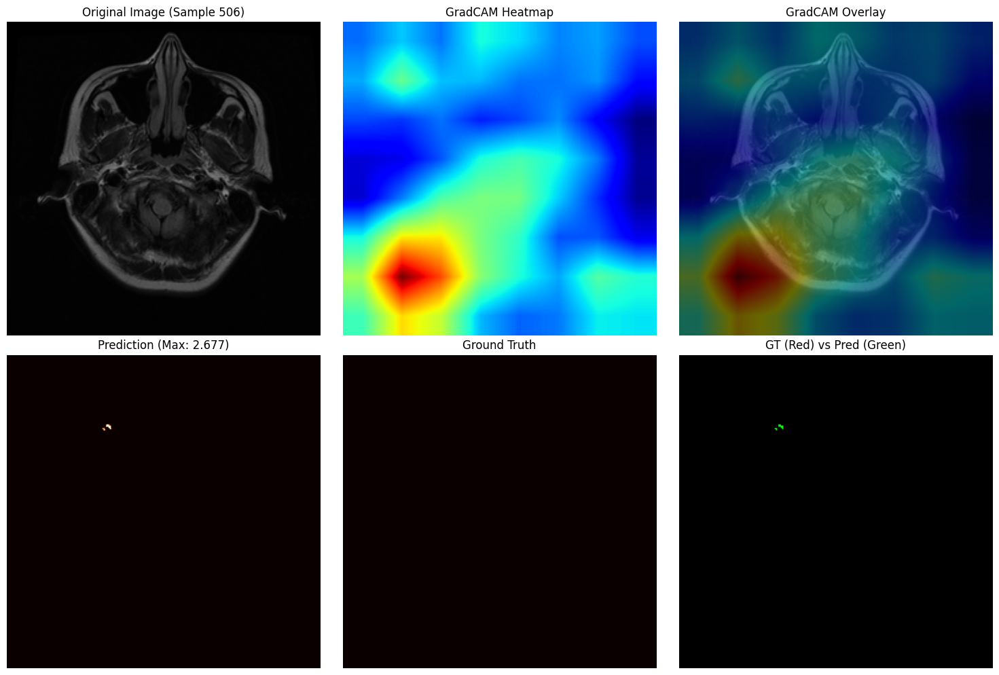

Mask shape after processing: torch.Size([1, 256, 256])
Saved: gradcam_images/u_resnet34/gradcam_u_resnet34_sample_44.png


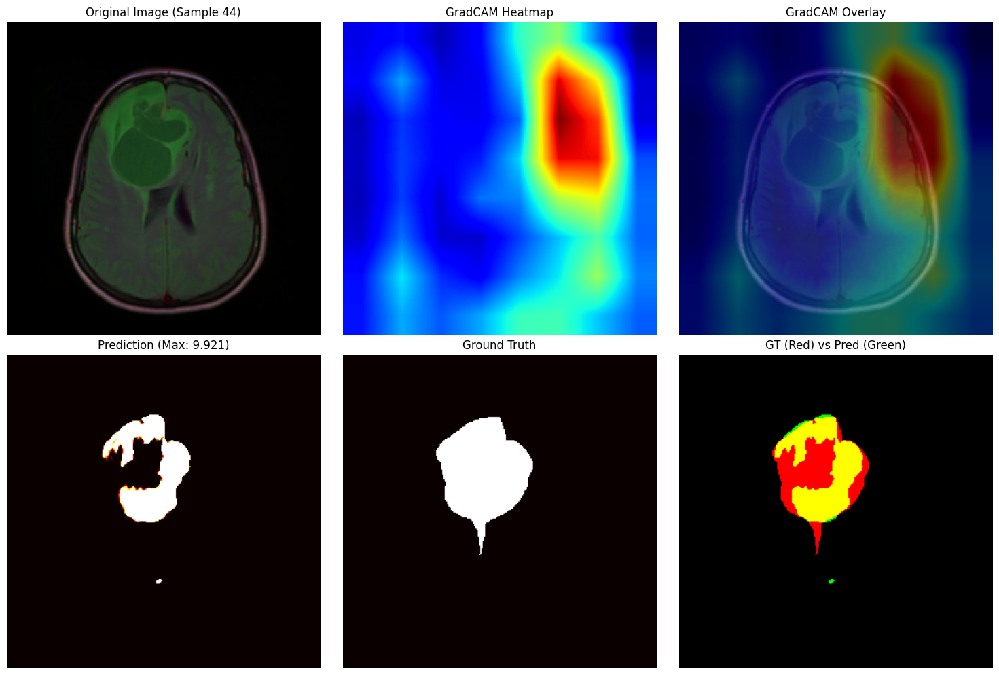

Mask shape after processing: torch.Size([1, 256, 256])
Skipping sample 341 (no tumor in GT or prediction)
Mask shape after processing: torch.Size([1, 256, 256])
Saved: gradcam_images/u_resnet34/gradcam_u_resnet34_sample_433.png


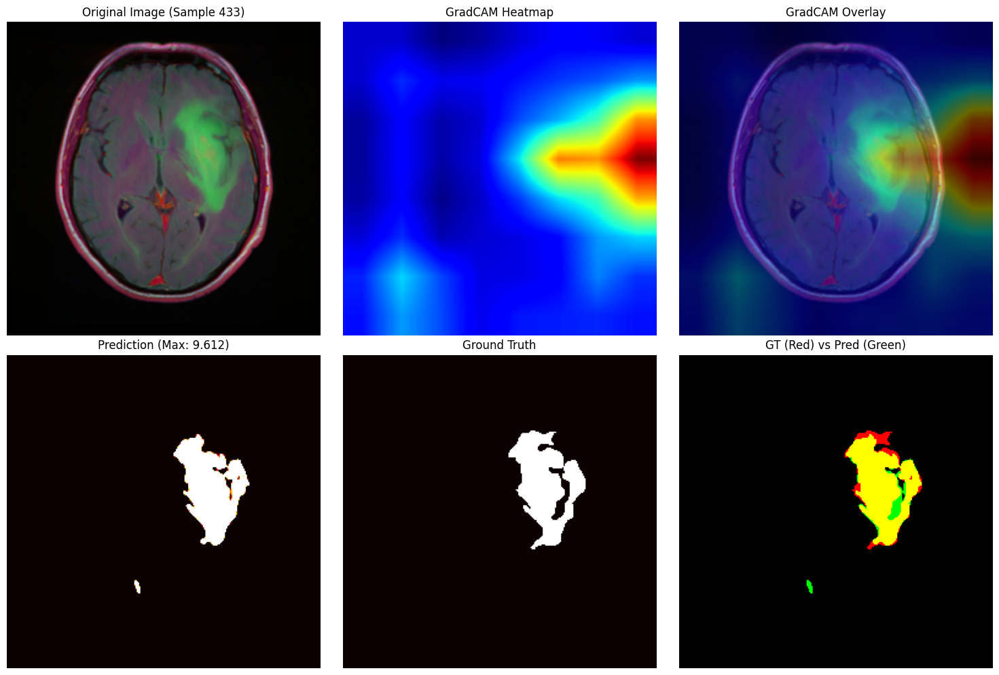

Mask shape after processing: torch.Size([1, 256, 256])
Saved: gradcam_images/u_resnet34/gradcam_u_resnet34_sample_103.png


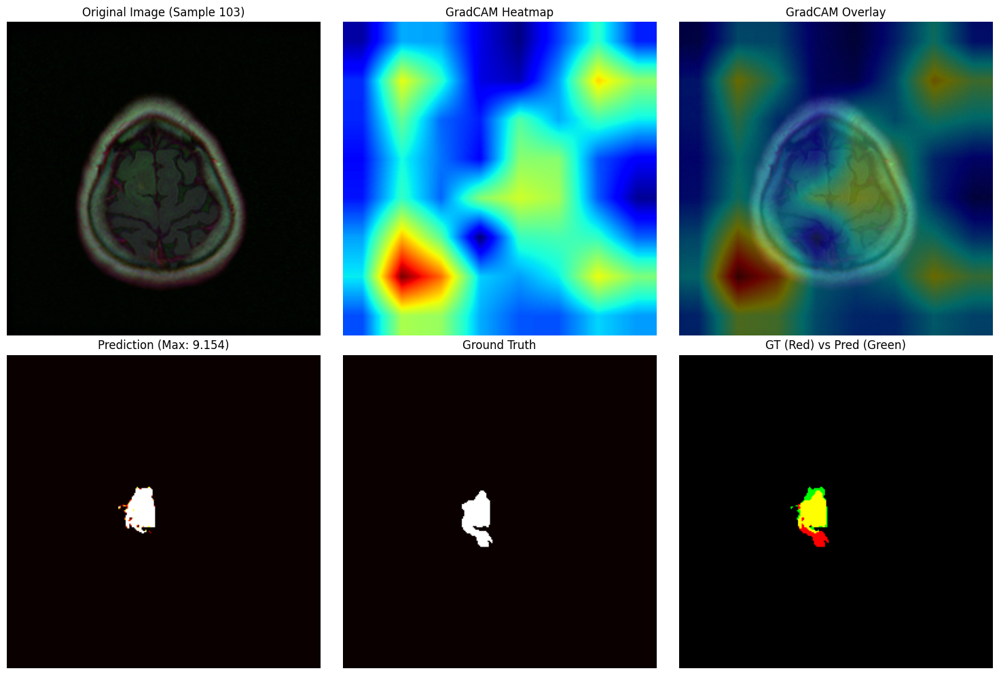

GradCAM hooks removed.


=== EfficientNet-B2 GradCAM ===
Saving GradCAMs to: gradcam_images/u_efficientnet_b2
Model has built-in activation: True
Using positive-only gradients: True
Using EfficientNet target layer: MBConvBlock
Mask shape after processing: torch.Size([1, 256, 256])
Saved: gradcam_images/u_efficientnet_b2/gradcam_u_efficientnet_b2_sample_498.png


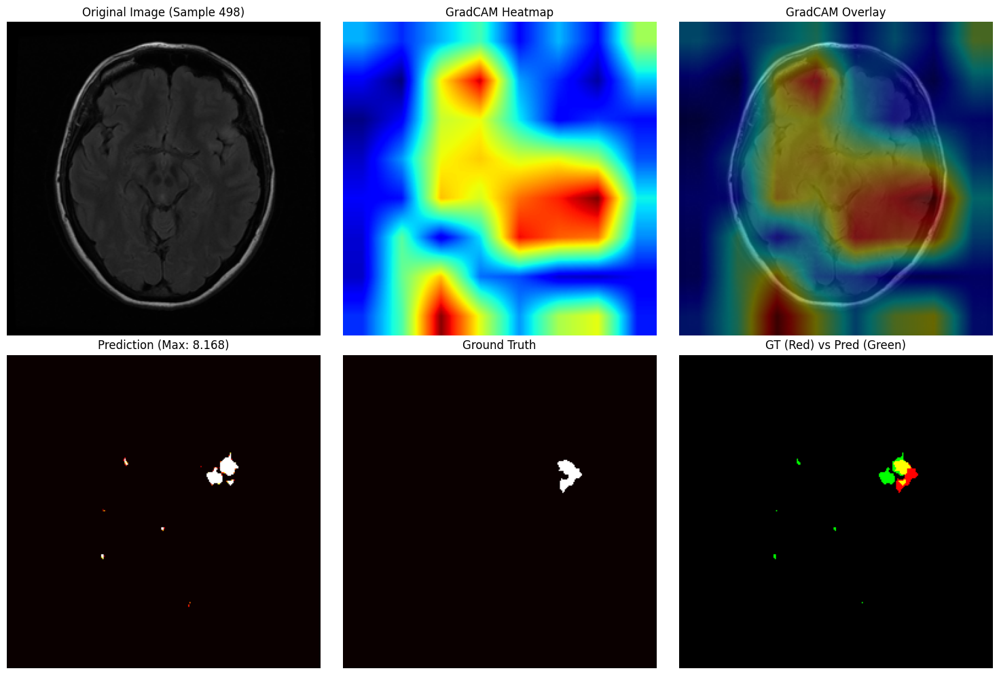

Mask shape after processing: torch.Size([1, 256, 256])
Saved: gradcam_images/u_efficientnet_b2/gradcam_u_efficientnet_b2_sample_252.png


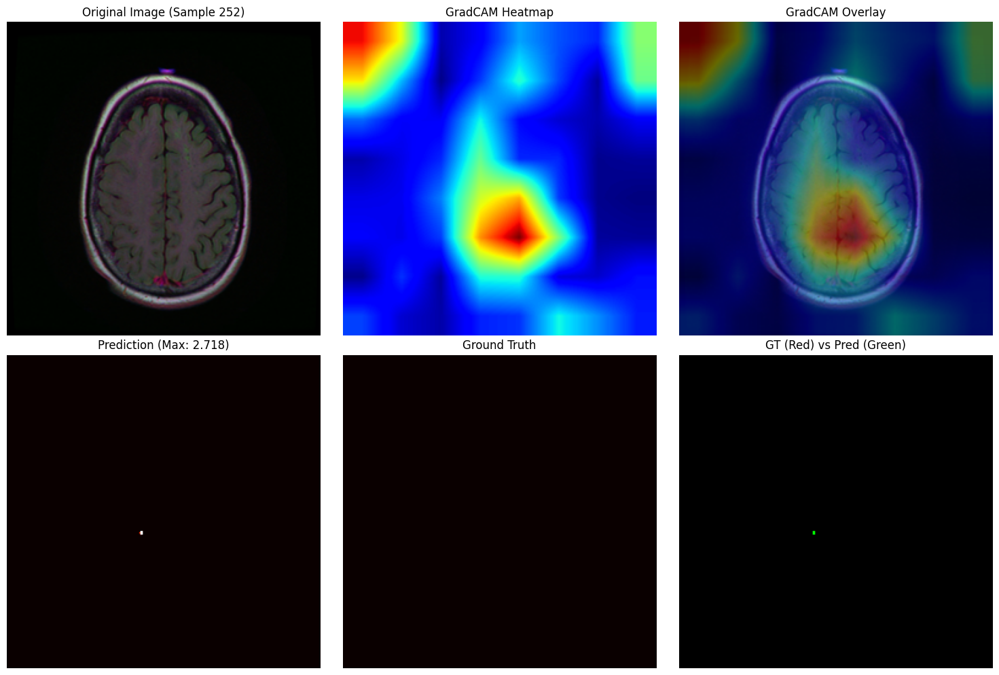

Mask shape after processing: torch.Size([1, 256, 256])
Skipping sample 341 (no tumor in GT or prediction)
Mask shape after processing: torch.Size([1, 256, 256])
Saved: gradcam_images/u_efficientnet_b2/gradcam_u_efficientnet_b2_sample_131.png


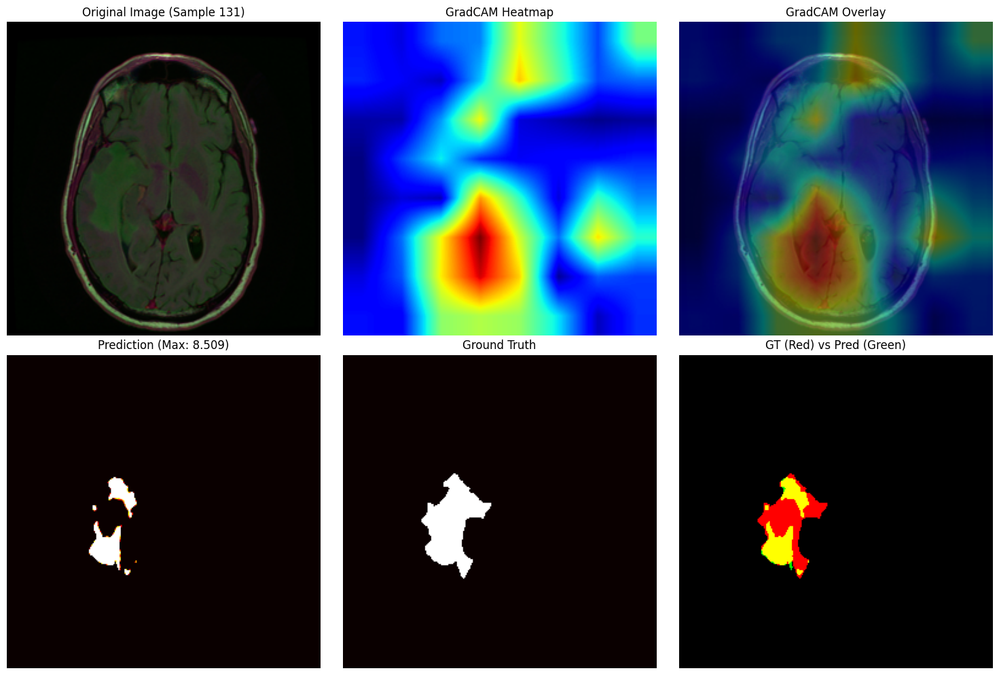

Mask shape after processing: torch.Size([1, 256, 256])
Skipping sample 333 (no tumor in GT or prediction)
Mask shape after processing: torch.Size([1, 256, 256])
Saved: gradcam_images/u_efficientnet_b2/gradcam_u_efficientnet_b2_sample_415.png


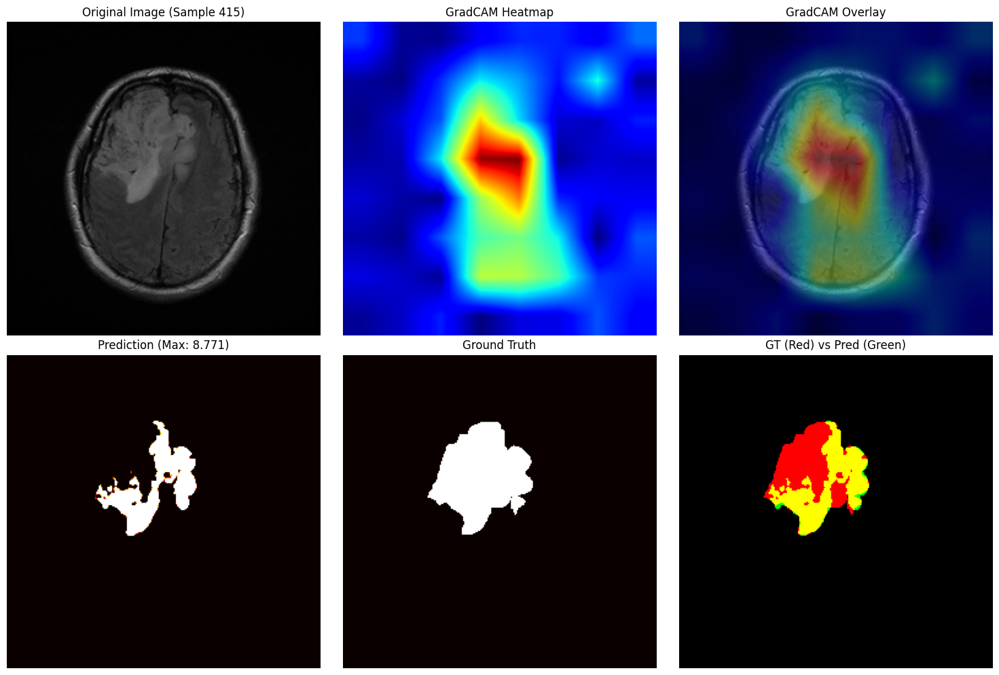

Mask shape after processing: torch.Size([1, 256, 256])
Skipping sample 198 (no tumor in GT or prediction)
Mask shape after processing: torch.Size([1, 256, 256])
Skipping sample 4 (no tumor in GT or prediction)
Mask shape after processing: torch.Size([1, 256, 256])
Saved: gradcam_images/u_efficientnet_b2/gradcam_u_efficientnet_b2_sample_243.png


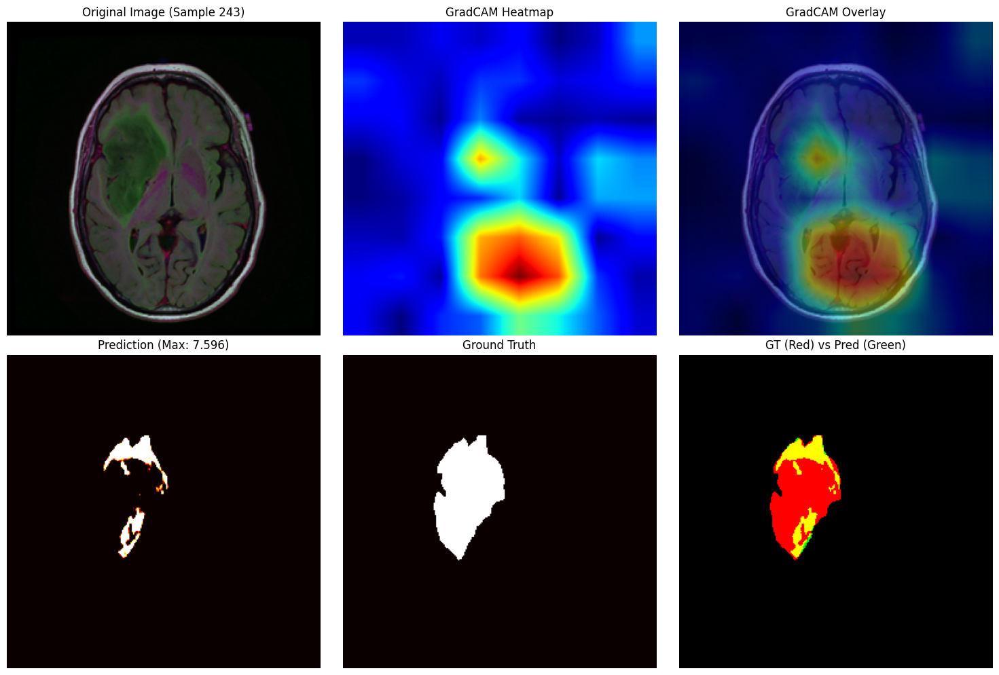

Mask shape after processing: torch.Size([1, 256, 256])
Skipping sample 176 (no tumor in GT or prediction)
GradCAM hooks removed.



In [68]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}\n")

# Visualize ResNet model
print("=== ResNet34 GradCAM ===")
gradcam_visualization(
    test_dataset, 
    resnet_model, 
    device=device, 
    n_samples=5,
    use_positive_only=True,  # Only backprop from tumor predictions
    threshold=0.5
)

# Visualize EfficientNet model
print("\n=== EfficientNet-B2 GradCAM ===")
gradcam_visualization(
    test_dataset, 
    efficentnet_model, 
    device=device, 
    n_samples=10,
    use_positive_only=True,
    threshold=0.5
)

=== ResNet34 GradCAM ===
Saving GradCAMs to: gradcam_images/u_resnet34
Model has built-in activation: True
Using ResNet target layer: BasicBlock
Mask shape after processing: torch.Size([1, 256, 256])
Saved: gradcam_images/u_resnet34/gradcam_u_resnet34_sample_116.png


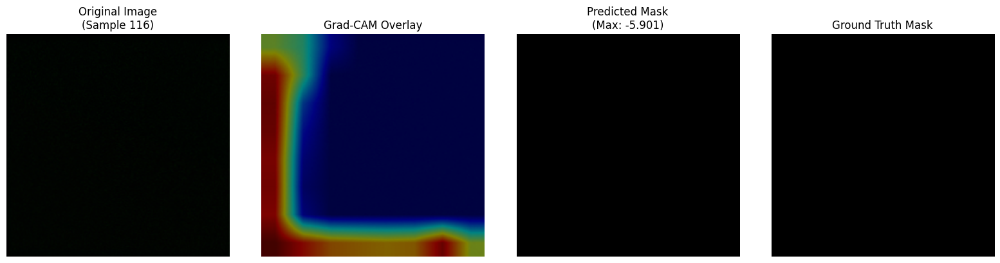

Mask shape after processing: torch.Size([1, 256, 256])
Saved: gradcam_images/u_resnet34/gradcam_u_resnet34_sample_405.png


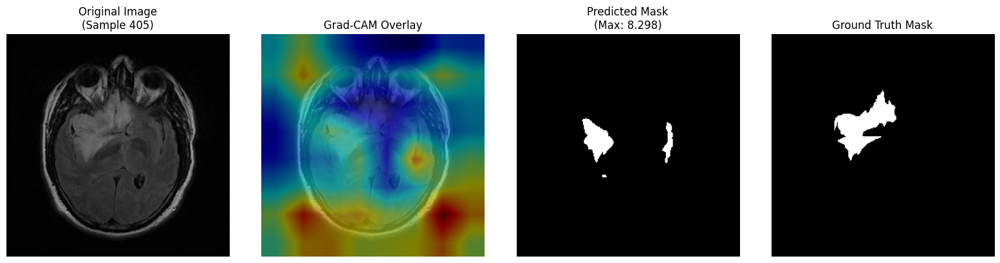

Mask shape after processing: torch.Size([1, 256, 256])
Saved: gradcam_images/u_resnet34/gradcam_u_resnet34_sample_134.png


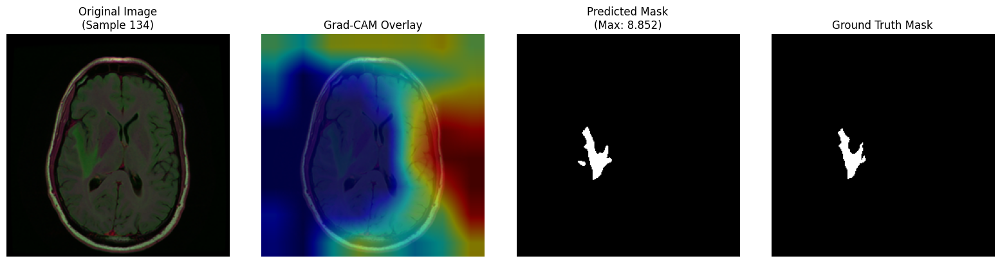

Mask shape after processing: torch.Size([1, 256, 256])
Saved: gradcam_images/u_resnet34/gradcam_u_resnet34_sample_183.png


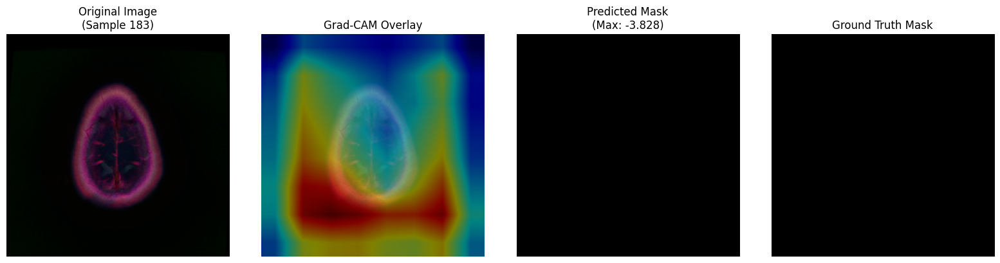

Mask shape after processing: torch.Size([1, 256, 256])
Saved: gradcam_images/u_resnet34/gradcam_u_resnet34_sample_313.png


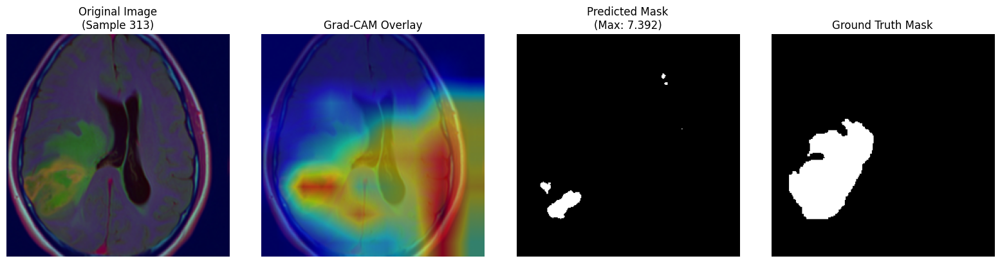

GradCAM hooks removed.


=== EfficientNet-B2 GradCAM ===
Saving GradCAMs to: gradcam_images/u_efficientnet_b2
Model has built-in activation: True
Using EfficientNet target layer: MBConvBlock
Mask shape after processing: torch.Size([1, 256, 256])
Saved: gradcam_images/u_efficientnet_b2/gradcam_u_efficientnet_b2_sample_105.png


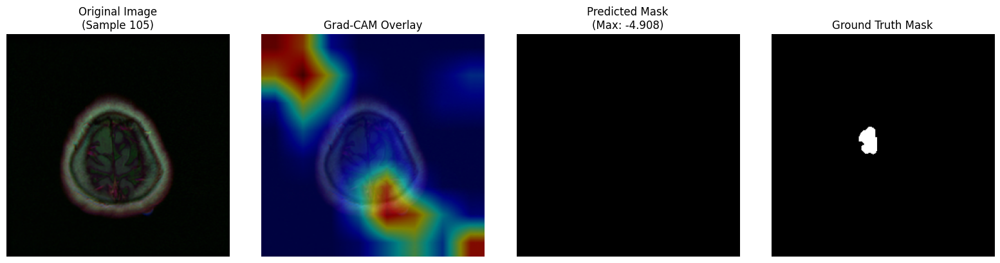

Mask shape after processing: torch.Size([1, 256, 256])
Saved: gradcam_images/u_efficientnet_b2/gradcam_u_efficientnet_b2_sample_372.png


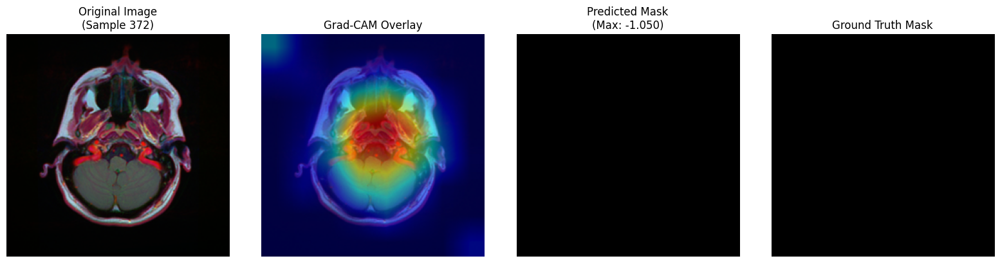

Mask shape after processing: torch.Size([1, 256, 256])
Saved: gradcam_images/u_efficientnet_b2/gradcam_u_efficientnet_b2_sample_79.png


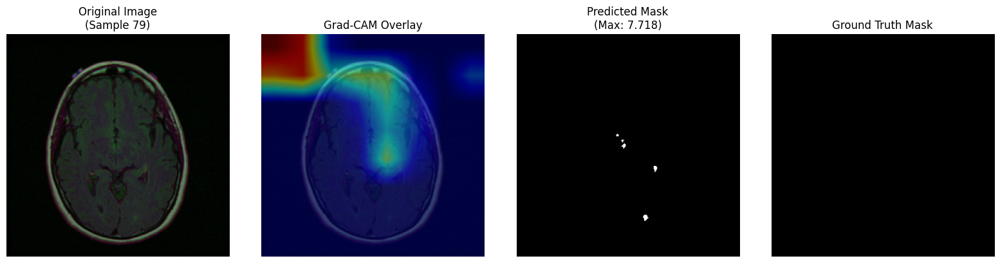

Mask shape after processing: torch.Size([1, 256, 256])
Saved: gradcam_images/u_efficientnet_b2/gradcam_u_efficientnet_b2_sample_402.png


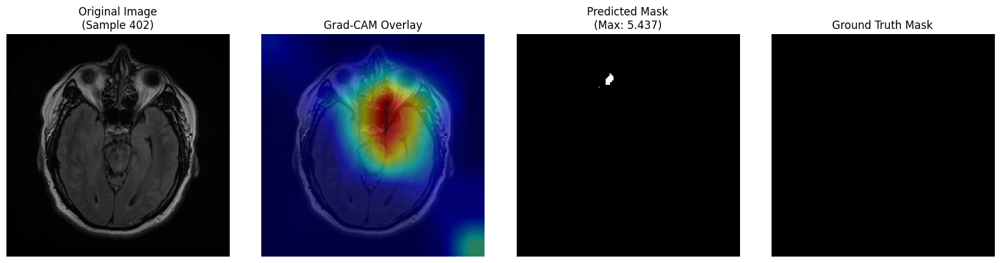

Mask shape after processing: torch.Size([1, 256, 256])
Saved: gradcam_images/u_efficientnet_b2/gradcam_u_efficientnet_b2_sample_35.png


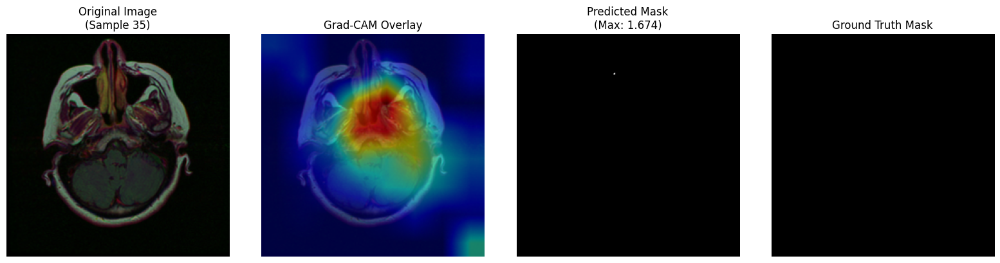

GradCAM hooks removed.



In [45]:

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Visualize ResNet model
print("=== ResNet34 GradCAM ===")
gradcam_visualization(test_dataset, resnet_model, device=device, n_samples=5)

# Visualize EfficientNet model
print("\n=== EfficientNet-B2 GradCAM ===")
gradcam_visualization(test_dataset, efficentnet_model, device=device, n_samples=5)
